In [6]:
import sys
print(sys.executable)

/usr/local/bin/python3


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# from pygam import GAM, s

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm

# import pmdarima as pm

from sklearn.metrics import mean_squared_error

# from arch.unitroot import PhillipsPerron


Data Importing & Cleaning

In [8]:
data = pd.read_csv('VIX_data.csv')

In [9]:
data.head()

,Date,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,...,USD INDEX Open,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,VXN Open,VXN High,VXN Low,VXN Close,VXN Adj Close
0,2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,16.530,...,85.910004,87.129997,84.470001,86.879997,86.879997,18.260000,31.170000,15.310000,15.810000,15.810000
1,2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,...,87.080002,88.440002,86.879997,88.360001,88.360001,15.740000,17.180000,13.480000,14.740000,14.740000
2,2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,...,88.230003,90.330002,87.629997,90.269997,90.269997,14.740000,24.080000,14.300000,19.639999,19.639999
3,2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,...,90.360001,95.480003,90.330002,94.800003,94.800003,19.730000,23.700001,16.389999,21.590000,21.590000
4,2015-04-01,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,13.300,...,98.419998,99.989998,94.400002,94.599998,94.599998,17.360001,18.639999,13.510000,16.510000,16.510000


In [10]:
data.shape

(103, 62)

In [11]:
data.isnull().sum()

Date                       0
Unemployment Rate          0
CPI                        0
Three Month T Bill Rate    0
Six Month T Bill Rate      0
                          ..
VXN Open                   0
VXN High                   0
VXN Low                    0
VXN Close                  0
VXN Adj Close              0
Length: 62, dtype: int64

In [12]:
(data== '').sum()

Date                       0
Unemployment Rate          0
CPI                        0
Three Month T Bill Rate    0
Six Month T Bill Rate      0
                          ..
VXN Open                   0
VXN High                   0
VXN Low                    0
VXN Close                  0
VXN Adj Close              0
Length: 62, dtype: int64

In [13]:
total_check = data.isnull().sum() + (data== '').sum()

In [14]:
has_missing_data = total_check.sum() >0
print(has_missing_data)

False


In [15]:
data.index = pd.to_datetime(data['Date'])

In [16]:
numeric_columns = data.select_dtypes(include=[np.number]).columns
column_means = data[numeric_columns].mean()

data_filled = data.copy()
data_filled[numeric_columns].fillna(column_means)

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,GDP,...,USD INDEX Open,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,VXN Open,VXN High,VXN Low,VXN Close,VXN Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,16.530,17912.079,...,85.910004,87.129997,84.470001,86.879997,86.879997,18.260000,31.170000,15.310000,15.810000,15.810000
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,17912.079,...,87.080002,88.440002,86.879997,88.360001,88.360001,15.740000,17.180000,13.480000,14.740000,14.740000
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,17912.079,...,88.230003,90.330002,87.629997,90.269997,90.269997,14.740000,24.080000,14.300000,19.639999,19.639999
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,18063.529,...,90.360001,95.480003,90.330002,94.800003,94.800003,19.730000,23.700001,16.389999,21.590000,21.590000
2015-04-01,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,13.300,18279.784,...,98.419998,99.989998,94.400002,94.599998,94.599998,17.360001,18.639999,13.510000,16.510000,16.510000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01,3.9,313.207,5.24,5.15,4.54,5.33,5.84,5108.065,15.745,29016.714,...,104.489998,106.519997,103.879997,106.220001,106.220001,17.590000,23.340000,16.340000,18.430000,18.430000
2024-05-01,4.0,313.225,5.25,5.17,4.48,5.33,5.75,5256.815,12.920,29016.714,...,106.320000,106.489998,104.080002,104.669998,104.669998,20.150000,20.230000,14.670000,16.700001,16.700001
2024-06-01,4.1,313.049,5.24,5.15,4.31,5.33,5.63,5433.740,12.645,29016.714,...,104.629997,106.129997,103.989998,105.870003,105.870003,16.830000,17.980000,6.480000,16.240000,16.240000


In [17]:
data_filled.head()

,Date,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,...,USD INDEX Open,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,VXN Open,VXN High,VXN Low,VXN Close,VXN Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,16.530,...,85.910004,87.129997,84.470001,86.879997,86.879997,18.260000,31.170000,15.310000,15.810000,15.810000
2014-11-01,2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,...,87.080002,88.440002,86.879997,88.360001,88.360001,15.740000,17.180000,13.480000,14.740000,14.740000
2014-12-01,2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,...,88.230003,90.330002,87.629997,90.269997,90.269997,14.740000,24.080000,14.300000,19.639999,19.639999
2015-01-01,2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,...,90.360001,95.480003,90.330002,94.800003,94.800003,19.730000,23.700001,16.389999,21.590000,21.590000
2015-04-01,2015-04-01,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,13.300,...,98.419998,99.989998,94.400002,94.599998,94.599998,17.360001,18.639999,13.510000,16.510000,16.510000


In [18]:
data_filled.shape

(103, 62)

In [19]:
VIX_data = data_filled['VIX']

In [20]:
VIX_data.describe()

count    103.000000
mean      17.515971
std        5.715289
min       10.005000
25%       13.235000
50%       15.960000
75%       21.165000
max       41.380000
Name: VIX, dtype: float64

In [21]:
VIX_data.head()

Date
2014-10-01    16.530
2014-11-01    13.330
2014-12-01    15.155
2015-01-01    19.455
2015-04-01    13.300
Name: VIX, dtype: float64

In [22]:
data_interim = data_filled.reset_index(drop=True)
data_interim.set_index('Date', inplace=True)

data_interim.index = pd.to_datetime(data_interim.index)

In [23]:
data_interim.head()

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,VIX,GDP,...,USD INDEX Open,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,VXN Open,VXN High,VXN Low,VXN Close,VXN Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,16.530,17912.079,...,85.910004,87.129997,84.470001,86.879997,86.879997,18.260000,31.170000,15.310000,15.810000,15.810000
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,13.330,17912.079,...,87.080002,88.440002,86.879997,88.360001,88.360001,15.740000,17.180000,13.480000,14.740000,14.740000
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,15.155,17912.079,...,88.230003,90.330002,87.629997,90.269997,90.269997,14.740000,24.080000,14.300000,19.639999,19.639999
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,19.455,18063.529,...,90.360001,95.480003,90.330002,94.800003,94.800003,19.730000,23.700001,16.389999,21.590000,21.590000
2015-04-01,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,13.300,18279.784,...,98.419998,99.989998,94.400002,94.599998,94.599998,17.360001,18.639999,13.510000,16.510000,16.510000


In [24]:
t = data_interim.isnull().sum()
t.isnull().sum()

np.int64(0)

In [25]:
Features = data_interim.drop('VIX', axis=1)

In [26]:
Features.head()

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,GDP,Initial Claims,...,USD INDEX Open,USD INDEX High,USD INDEX Low,USD INDEX Close,USD INDEX Adj Close,VXN Open,VXN High,VXN Low,VXN Close,VXN Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,17912.079,1155000,...,85.910004,87.129997,84.470001,86.879997,86.879997,18.260000,31.170000,15.310000,15.810000,15.810000
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,17912.079,1458000,...,87.080002,88.440002,86.879997,88.360001,88.360001,15.740000,17.180000,13.480000,14.740000,14.740000
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,17912.079,1138000,...,88.230003,90.330002,87.629997,90.269997,90.269997,14.740000,24.080000,14.300000,19.639999,19.639999
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,18063.529,1438000,...,90.360001,95.480003,90.330002,94.800003,94.800003,19.730000,23.700001,16.389999,21.590000,21.590000
2015-04-01,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,18279.784,1144000,...,98.419998,99.989998,94.400002,94.599998,94.599998,17.360001,18.639999,13.510000,16.510000,16.510000


In [27]:
Features.shape

(103, 60)

In [28]:
Features.columns

Index(['Unemployment Rate', 'CPI', 'Three Month T Bill Rate',
       'Six Month T Bill Rate', '10-Year Treasury Constant Maturity Rate',
       'Fed Rate', 'BBB Rate', 'SP500 Index', 'GDP', 'Initial Claims',
       'JPY/USD Spot Rate', 'Total Nonfarm Employees', 'Spot Crude Oil Price',
       'SP500 Volume', 'NASDAQ Open', 'NASDAQ High', 'NASDAQ Low',
       'NASDAQ Close', 'NASDAQ Adj Close', 'NASDAQ Volume', 'DJI Open',
       'DJI High', 'DJI Low', 'DJI Close', 'DJI Adj Close', 'DJI Volume',
       'RUSSELL2000 Open', 'RUSSELL2000 High', 'RUSSELL2000 Low',
       'RUSSELL2000 Close', 'RUSSELL2000 Adj Close', 'RUSSELL2000 Volume',
       'FTSE Open', 'FTSE High', 'FTSE Low', 'FTSE Close', 'FTSE Adj Close',
       'FTSE Volume', 'NIKKEI Open', 'NIKKEI High', 'NIKKEI Low',
       'NIKKEI Close', 'NIKKEI Adj Close', 'NIKKEI Volume', 'GOLD Open',
       'GOLD High', 'GOLD Low', 'GOLD Close', 'GOLD Adj Close', 'GOLD Volume',
       'USD INDEX Open', 'USD INDEX High', 'USD INDEX Low', 'USD

In [29]:
Features_clean = Features[['Unemployment Rate', 'CPI', 'Three Month T Bill Rate', 'Six Month T Bill Rate', 
                           '10-Year Treasury Constant Maturity Rate', 'Fed Rate', 'BBB Rate', 'SP500 Index', 
                           'SP500 Volume', 'NASDAQ Adj Close','NASDAQ Volume','DJI Adj Close','DJI Volume', 
                           'RUSSELL2000 Adj Close','RUSSELL2000 Volume','FTSE Adj Close','FTSE Volume','NIKKEI Adj Close',
                           'NIKKEI Volume','GDP', 'Initial Claims', 'JPY/USD Spot Rate', 'Spot Crude Oil Price',
                           'GOLD Adj Close','GOLD Volume', 'USD INDEX Adj Close']]

In [30]:
Features_clean.head()

,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,SP500 Volume,NASDAQ Adj Close,...,FTSE Volume,NIKKEI Adj Close,NIKKEI Volume,GDP,Initial Claims,JPY/USD Spot Rate,Spot Crude Oil Price,GOLD Adj Close,GOLD Volume,USD INDEX Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,93714040000,4630.740234,...,20158414000,16413.759766,3436700000,17912.079,1155000,108.03,84.40,1171.099976,4510,86.879997
2014-11-01,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,63600190000,4791.629883,...,14266358300,17459.849609,3155400000,17912.079,1458000,116.30,75.79,1175.199951,299410,88.360001
2014-12-01,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,80743820000,4736.049805,...,13989469200,17450.769531,2962900000,17912.079,1138000,119.32,59.29,1183.900024,11140,90.269997
2015-01-01,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,77330040000,4635.240234,...,15644596100,17674.390625,2691500000,18063.529,1438000,118.25,47.22,1278.500000,258615,94.800003
2015-04-01,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,72060940000,4941.419922,...,14644991100,19520.009766,3047400000,18279.784,1144000,119.51,54.45,1182.400024,7838,94.599998


In [31]:
Features_clean.shape

(103, 26)

In [32]:
Features_clean.isnull().sum()

Unemployment Rate                          0
CPI                                        0
Three Month T Bill Rate                    0
Six Month T Bill Rate                      0
10-Year Treasury Constant Maturity Rate    0
Fed Rate                                   0
BBB Rate                                   0
SP500 Index                                0
SP500 Volume                               0
NASDAQ Adj Close                           0
NASDAQ Volume                              0
DJI Adj Close                              0
DJI Volume                                 0
RUSSELL2000 Adj Close                      0
RUSSELL2000 Volume                         0
FTSE Adj Close                             0
FTSE Volume                                0
NIKKEI Adj Close                           0
NIKKEI Volume                              0
GDP                                        0
Initial Claims                             0
JPY/USD Spot Rate                          0
Spot Crude

In [33]:
if isinstance(VIX_data, pd.Series):
    VIX = VIX_data.to_frame(name='VIX')


In [34]:
isinstance(Features_clean, pd.DataFrame)

True

In [35]:
VIX.head()

,VIX
Date,
2014-10-01,16.530
2014-11-01,13.330
2014-12-01,15.155
2015-01-01,19.455
2015-04-01,13.300


In [36]:
data_clean = pd.concat([VIX, Features_clean], axis=1, join='inner')

In [37]:
data_clean.shape

(103, 27)

In [38]:
data_clean.head()

,VIX,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,SP500 Volume,...,FTSE Volume,NIKKEI Adj Close,NIKKEI Volume,GDP,Initial Claims,JPY/USD Spot Rate,Spot Crude Oil Price,GOLD Adj Close,GOLD Volume,USD INDEX Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,16.530,5.7,237.430,0.02,0.05,2.30,0.09,3.50,1928.210,93714040000,...,20158414000,16413.759766,3436700000,17912.079,1155000,108.03,84.40,1171.099976,4510,86.879997
2014-11-01,13.330,5.8,236.983,0.02,0.07,2.33,0.09,3.63,2039.820,63600190000,...,14266358300,17459.849609,3155400000,17912.079,1458000,116.30,75.79,1175.199951,299410,88.360001
2014-12-01,15.155,5.6,236.252,0.03,0.11,2.21,0.12,3.78,2063.890,80743820000,...,13989469200,17450.769531,2962900000,17912.079,1138000,119.32,59.29,1183.900024,11140,90.269997
2015-01-01,19.455,5.7,234.747,0.03,0.08,1.88,0.11,3.64,2024.465,77330040000,...,15644596100,17674.390625,2691500000,18063.529,1438000,118.25,47.22,1278.500000,258615,94.800003
2015-04-01,13.300,5.4,236.222,0.02,0.09,1.94,0.12,3.41,2097.290,72060940000,...,14644991100,19520.009766,3047400000,18279.784,1144000,119.51,54.45,1182.400024,7838,94.599998


In [39]:
data_clean.isnull().sum()

VIX                                        0
Unemployment Rate                          0
CPI                                        0
Three Month T Bill Rate                    0
Six Month T Bill Rate                      0
10-Year Treasury Constant Maturity Rate    0
Fed Rate                                   0
BBB Rate                                   0
SP500 Index                                0
SP500 Volume                               0
NASDAQ Adj Close                           0
NASDAQ Volume                              0
DJI Adj Close                              0
DJI Volume                                 0
RUSSELL2000 Adj Close                      0
RUSSELL2000 Volume                         0
FTSE Adj Close                             0
FTSE Volume                                0
NIKKEI Adj Close                           0
NIKKEI Volume                              0
GDP                                        0
Initial Claims                             0
JPY/USD Sp

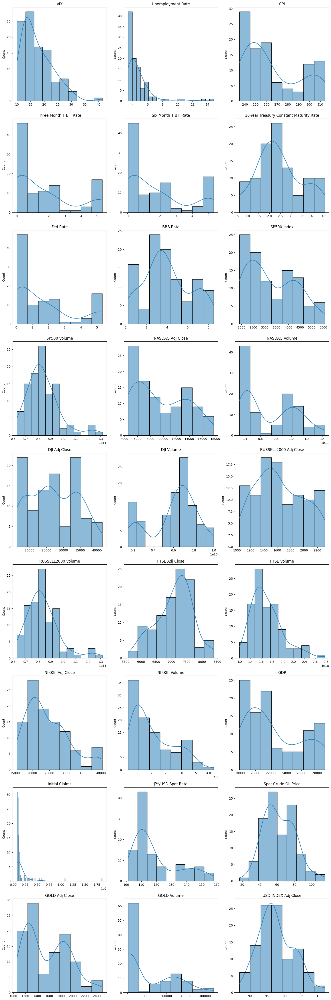

In [40]:
# plt.style.use('seaborn')

n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
# fig.suptitle('Histograms of all Features', fontsize=16)

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.histplot(data=data_clean, x=column, kde=True, bins='auto', ax=axes[i])
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

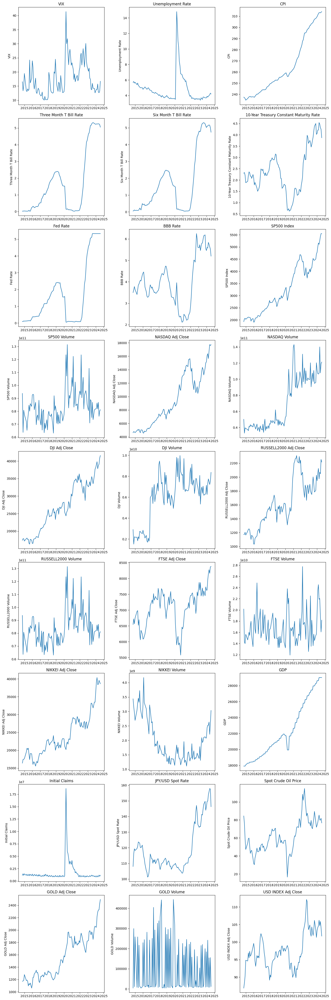

In [41]:
n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
# fig.suptitle('All Features', fontsize=16)

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.lineplot(data=data_clean, x=data_clean.index, y=column, ax=axes[i])
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [42]:
#Rolling statistics

def calculate_rolling_stats(df, window):
    rolling_mean = df.rolling(window=window).mean()
    rolling_std = df.rolling(window=window).std()
    return rolling_mean, rolling_std

In [43]:

window_size = 6

rolling_mean, rolling_std = calculate_rolling_stats(data_clean, window=window_size)

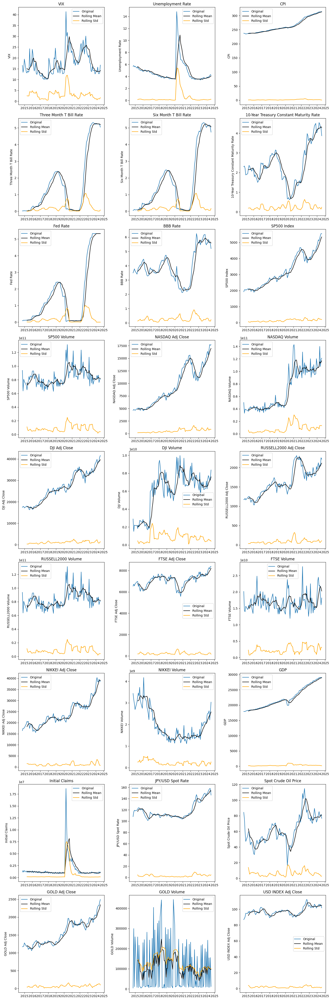

In [44]:

n_cols = 3
n_rows = (len(data_clean.columns)-1) // n_cols + 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

axes = axes.flatten()

for i, column in enumerate(data_clean.columns):
    sns.lineplot(data=data_clean, x=data_clean.index, y=column, label='Original', ax=axes[i])
    sns.lineplot(data=rolling_mean, x=rolling_mean.index, y=rolling_mean[column], color='black', label='Rolling Mean', ax=axes[i])
    sns.lineplot(data=rolling_std, x=rolling_std.index, y=rolling_std[column], color='orange', label='Rolling Std', ax=axes[i])
    axes[i].legend(loc='best')
    axes[i].set_title(column)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [45]:
data_log = np.log1p(data_clean)

In [46]:
data_log

,VIX,Unemployment Rate,CPI,Three Month T Bill Rate,Six Month T Bill Rate,10-Year Treasury Constant Maturity Rate,Fed Rate,BBB Rate,SP500 Index,SP500 Volume,...,FTSE Volume,NIKKEI Adj Close,NIKKEI Volume,GDP,Initial Claims,JPY/USD Spot Rate,Spot Crude Oil Price,GOLD Adj Close,GOLD Volume,USD INDEX Adj Close
Date,,,,,,,,,,,,,,,,,,,,,
2014-10-01,2.863914,1.902108,5.474076,0.019803,0.048790,1.193922,0.086178,1.504077,7.564866,25.263514,...,23.726888,9.705936,21.957778,9.793286,13.959612,4.691623,4.447346,7.066552,8.414274,4.475972
2014-11-01,2.662355,1.916923,5.472199,0.019803,0.067659,1.202972,0.086178,1.532557,7.621107,24.875882,...,23.381170,9.767716,21.872381,9.793286,14.192577,4.764735,4.341074,7.070044,12.609572,4.492673
2014-12-01,2.782230,1.887070,5.469123,0.029559,0.104360,1.166271,0.113329,1.564441,7.632832,25.114547,...,23.361571,9.767196,21.809434,9.793286,13.944784,4.790155,4.099166,7.077414,9.318387,4.513822
2015-01-01,3.018227,1.902108,5.462759,0.029559,0.076961,1.057790,0.104360,1.534714,7.613555,25.071348,...,23.473391,9.779929,21.713364,9.801706,14.178765,4.781222,3.875774,7.154225,12.463100,4.562263
2015-04-01,2.660260,1.856298,5.468996,0.019803,0.086178,1.078410,0.113329,1.483875,7.648878,25.000778,...,23.407364,9.879247,21.837555,9.813606,13.950042,4.791733,4.015482,7.076147,8.966867,4.560173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01,2.818100,1.589235,5.750052,1.830980,1.816452,1.711995,1.845300,1.922788,8.538772,25.126897,...,23.810151,10.555986,21.648437,10.275662,13.642348,5.042715,4.458409,7.737355,9.001839,4.674883
2024-05-01,2.633327,1.609438,5.750109,1.832581,1.819699,1.701105,1.845300,1.909543,8.567471,25.187445,...,23.816687,10.558125,21.691162,10.275662,13.701223,5.055417,4.394696,7.751002,11.946122,4.660321
2024-06-01,2.613373,1.629241,5.749549,1.830980,1.816452,1.669592,1.845300,1.891605,8.600567,25.054336,...,23.662986,10.586182,21.515806,10.275662,13.984410,5.068023,4.391606,7.753065,8.982059,4.671613


In [47]:
#Decompose

def decompose_and_plot(series, column, period):
    decomposition = seasonal_decompose(series, model='additive', period=period)

    fig = plt.figure(figsize=(15, 10))
    gs = fig.add_gridspec(2, 3)
    
    fig.suptitle(column, fontsize=20)
    

    #Plot original data
    ax_original = fig.add_subplot(gs[0, :])
    ax_original.plot(series)
    ax_original.set_title('Original')
    ax_original.set_xlabel('')

    #Plot trend
    ax_trend = fig.add_subplot(gs[1, 0])
    ax_trend.plot(decomposition.trend)
    ax_trend.set_title('Trend')

    #Plot seasonal
    ax_seasonal = fig.add_subplot(gs[1, 1])
    ax_seasonal.plot(decomposition.seasonal)
    ax_seasonal.set_title('Seasonal')

    #Plot residual
    ax_residual = fig.add_subplot(gs[1, 2])
    ax_residual.plot(decomposition.resid)
    ax_residual.set_title('Residual')

    plt.tight_layout()
    plt.show()



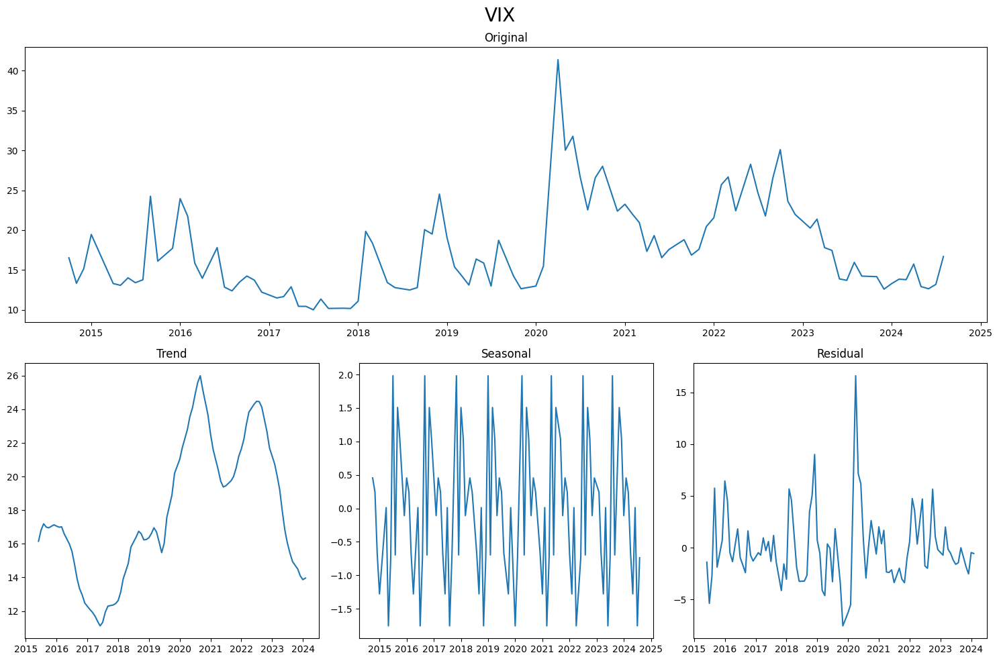

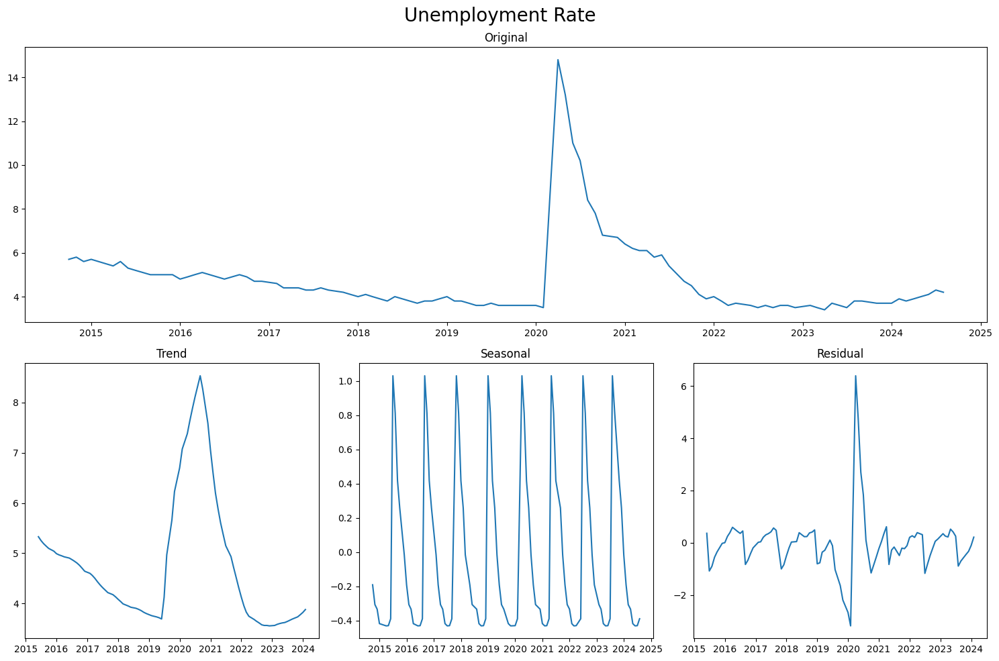

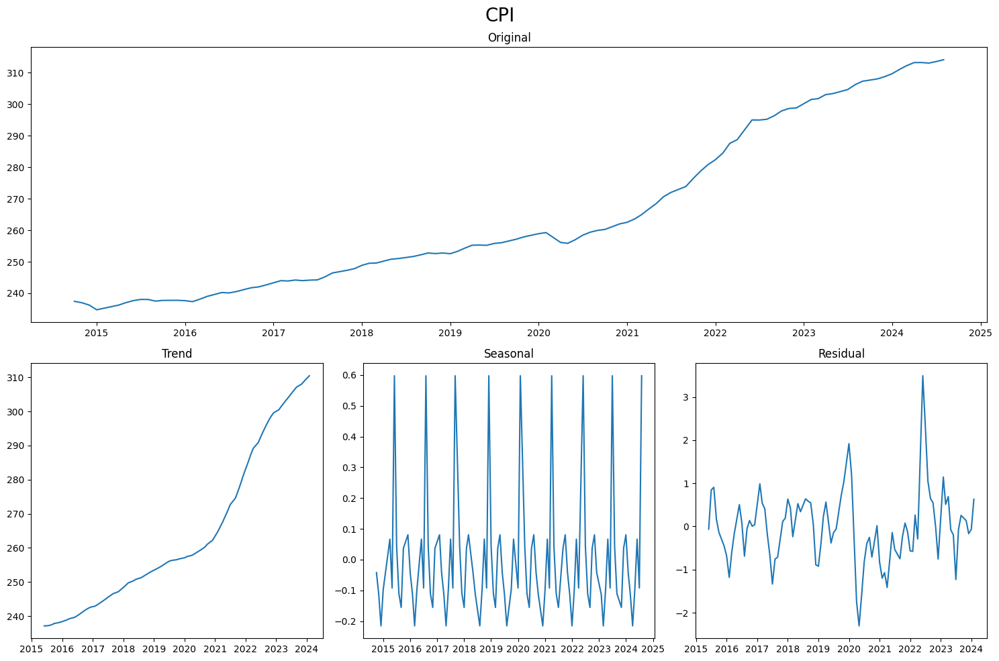

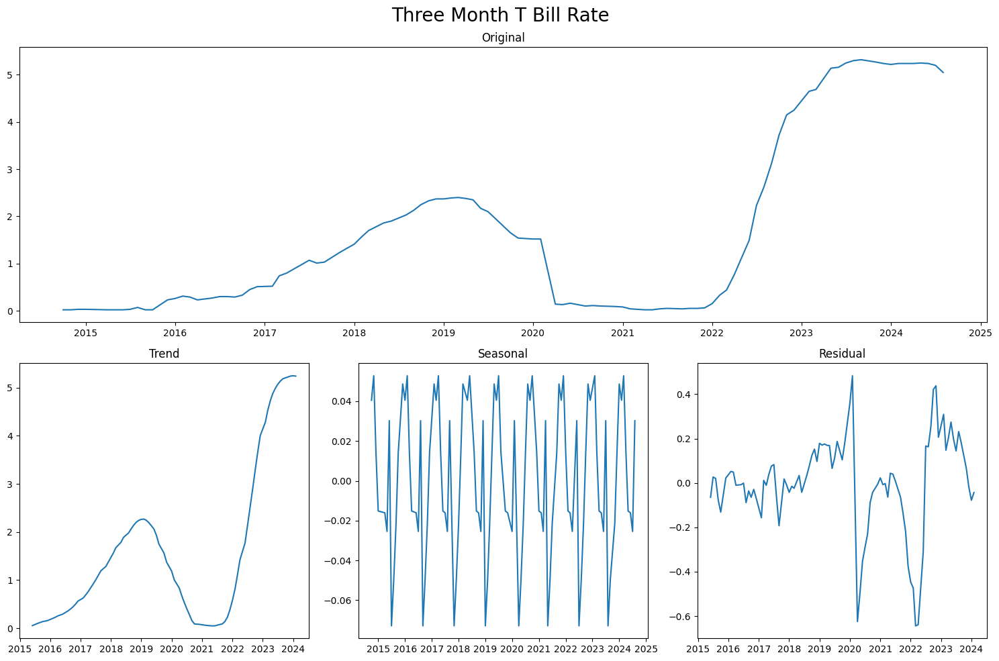

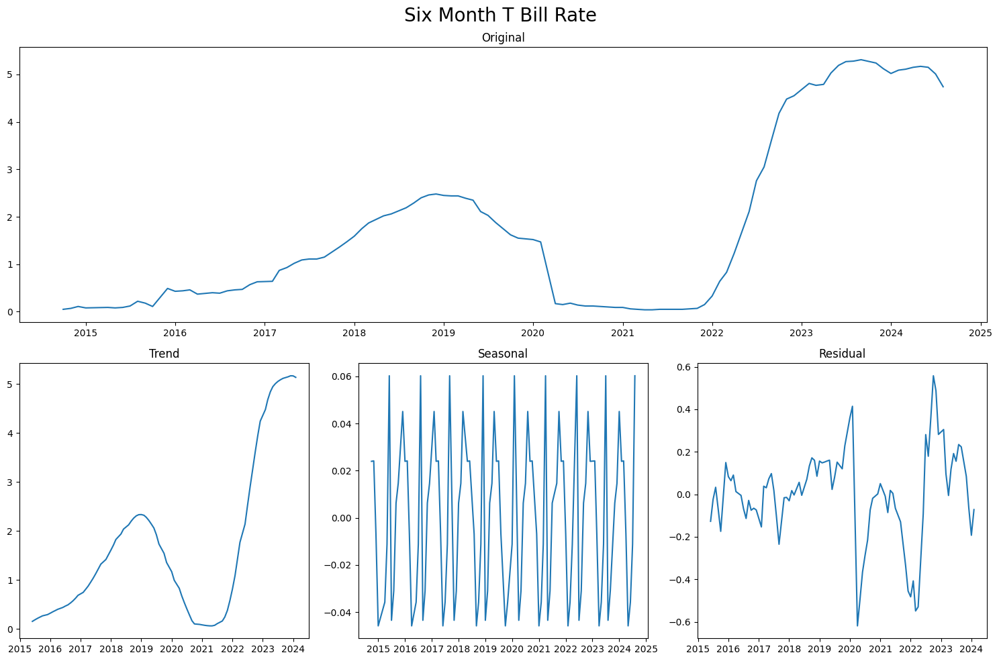

...

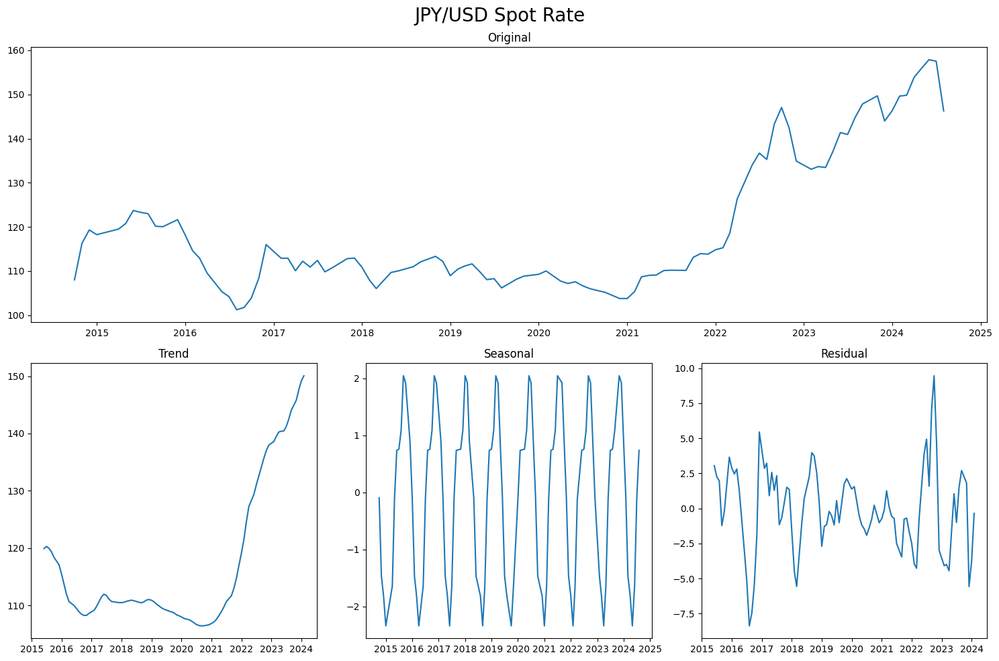

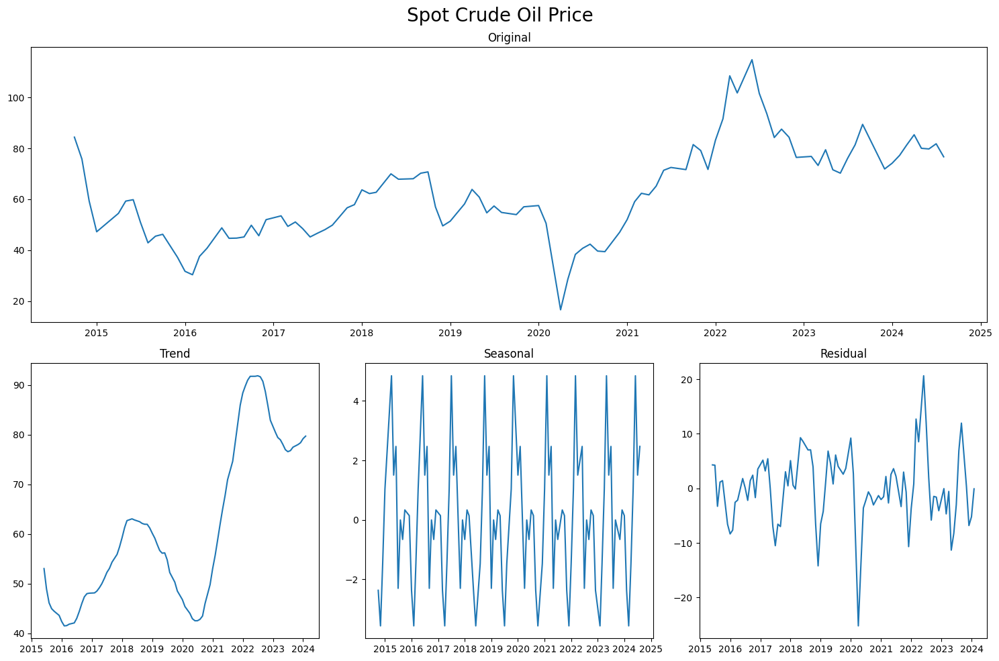

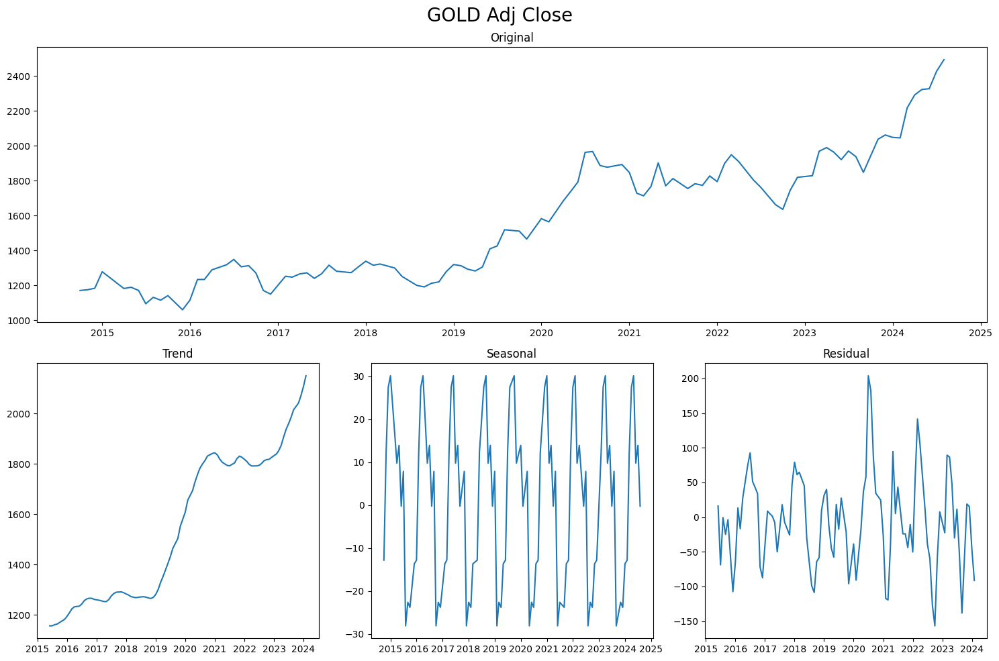

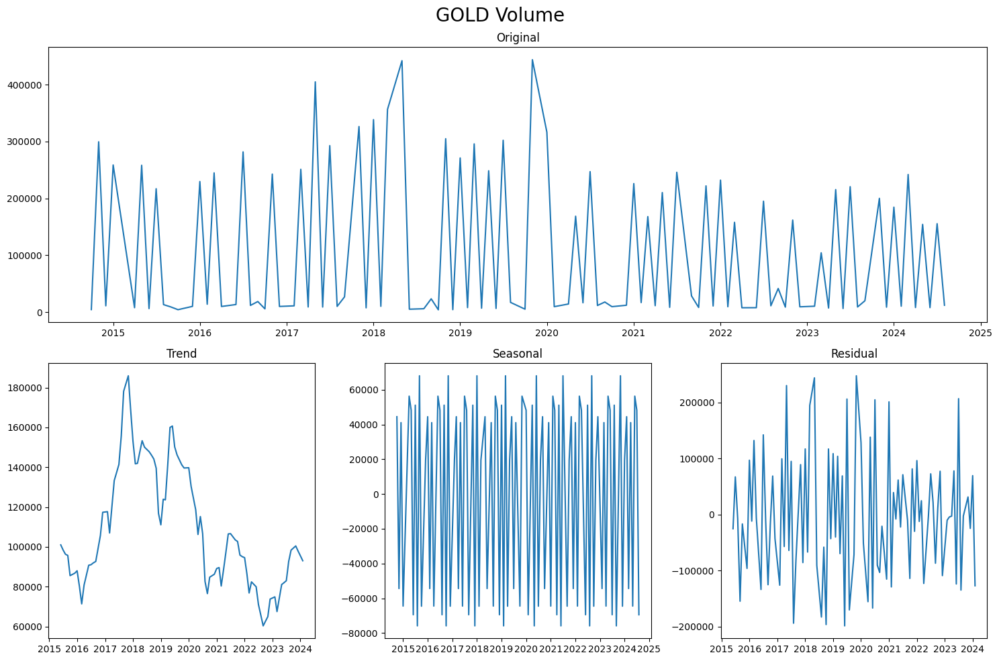

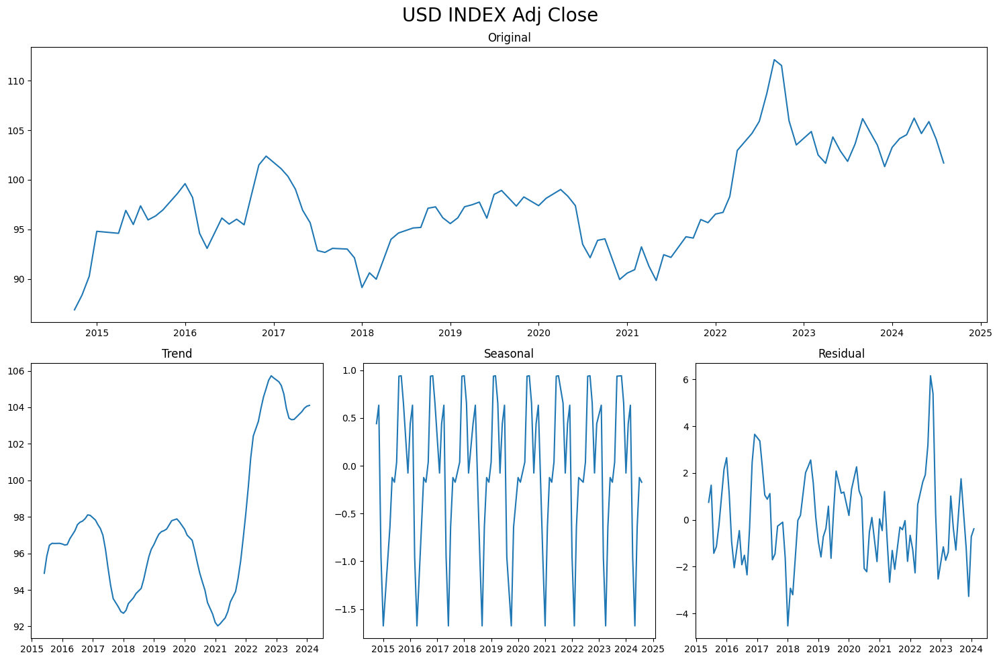

In [48]:
period = 12

for column in data_clean.columns:
    decompose_and_plot(data_clean[column], column, period)

In [49]:
# #Generalized Additive Models 

# gam = GAM(s(0))
# gam.fit(Features_clean['BBB Rate'], VIX)

# XX = gam.generate_X_grid(term=0, n=500)
# plt.figure(figsize=(10,6))
# plt.scatter(Features_clean['BBB Rate'], VIX, alpha=0.1)
# plt.plot(XX, gam.predict(XX), color='r', linewidth=2)
# plt.title('GAM: VIX Vs BBB Rate')
# plt.xlabel('BBB Rate')
# plt.ylabel('VIX')
# plt.show()



In [50]:
# gam.statistics_

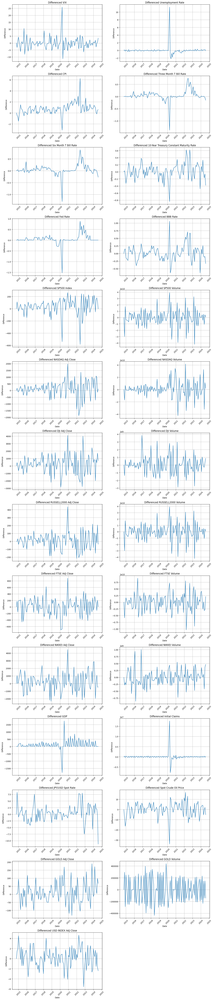

In [51]:
#Difference the Data

differenced_data = data_clean.diff() #First order differencing

differenced_data.iloc[0] = 0 #First entry of differenced data is typically NaN because there is no previous value to subtract from the first observation

num_columns = len(differenced_data.columns)

nrows = (num_columns + 1) // 2


plt.figure(figsize=(15, 5 * nrows))

for i, column in enumerate(differenced_data.columns):
    plt.subplot(nrows, 2, i + 1)
    plt.plot(differenced_data.index, differenced_data[column])
    plt.title(f'Differenced {column}')
    plt.xlabel('Date')
    plt.ylabel('Difference')
    plt.grid(True)
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()



In [52]:
#Check for NaN or infinite values

missing_values = differenced_data.isnull().sum() + (differenced_data == float('inf')).sum() + (differenced_data == float('-inf')).sum()
print(f'Number of missing or ifinite values: {missing_values}')

Number of missing or ifinite values: VIX                                        0
Unemployment Rate                          0
CPI                                        0
Three Month T Bill Rate                    0
Six Month T Bill Rate                      0
10-Year Treasury Constant Maturity Rate    0
Fed Rate                                   0
BBB Rate                                   0
SP500 Index                                0
SP500 Volume                               0
NASDAQ Adj Close                           0
NASDAQ Volume                              0
DJI Adj Close                              0
DJI Volume                                 0
RUSSELL2000 Adj Close                      0
RUSSELL2000 Volume                         0
FTSE Adj Close                             0
FTSE Volume                                0
NIKKEI Adj Close                           0
NIKKEI Volume                              0
GDP                                        0
Initial Claims    

In [53]:
#ADF / Augmented Dickey Fuller Test
def adfuller_test(series):
    adf_result = adfuller(series, autolag='AIC')
    return{
        'ADF Statistic': adf_result[0], 
        'p-value': adf_result[1],
        'Lags used': adf_result[2],
        'Observations used': adf_result[3],
        'Critical Values': adf_result[4]
        }

In [54]:
adf_results = differenced_data.apply(adfuller_test, axis=0)

In [55]:
adf_results.describe()

count                                                    27
unique                                                   27
top       {'ADF Statistic': -12.99487777407351, 'p-value...
freq                                                      1
dtype: object

In [56]:
print(adf_results)

VIX                                        {'ADF Statistic': -12.99487777407351, 'p-value...
Unemployment Rate                          {'ADF Statistic': -10.753585860668721, 'p-valu...
CPI                                        {'ADF Statistic': -4.778606942416468, 'p-value...
Three Month T Bill Rate                    {'ADF Statistic': -2.2457473179743133, 'p-valu...
Six Month T Bill Rate                      {'ADF Statistic': -2.7732120101745545, 'p-valu...
10-Year Treasury Constant Maturity Rate    {'ADF Statistic': -7.29081499537807, 'p-value'...
Fed Rate                                   {'ADF Statistic': -2.549382673882691, 'p-value...
BBB Rate                                   {'ADF Statistic': -7.60126466428152, 'p-value'...
SP500 Index                                {'ADF Statistic': -10.178219623329483, 'p-valu...
SP500 Volume                               {'ADF Statistic': -6.419780434213517, 'p-value...
NASDAQ Adj Close                           {'ADF Statistic': -4.454019

In [57]:
adf_results['VIX']

{'ADF Statistic': np.float64(-12.99487777407351),
 'p-value': np.float64(2.7634496911162387e-24),
 'Lags used': 0,
 'Observations used': 102,
 'Critical Values': {'1%': np.float64(-3.4961490537199116),
  '5%': np.float64(-2.8903209639580556),
  '10%': np.float64(-2.5821223452518263)}}

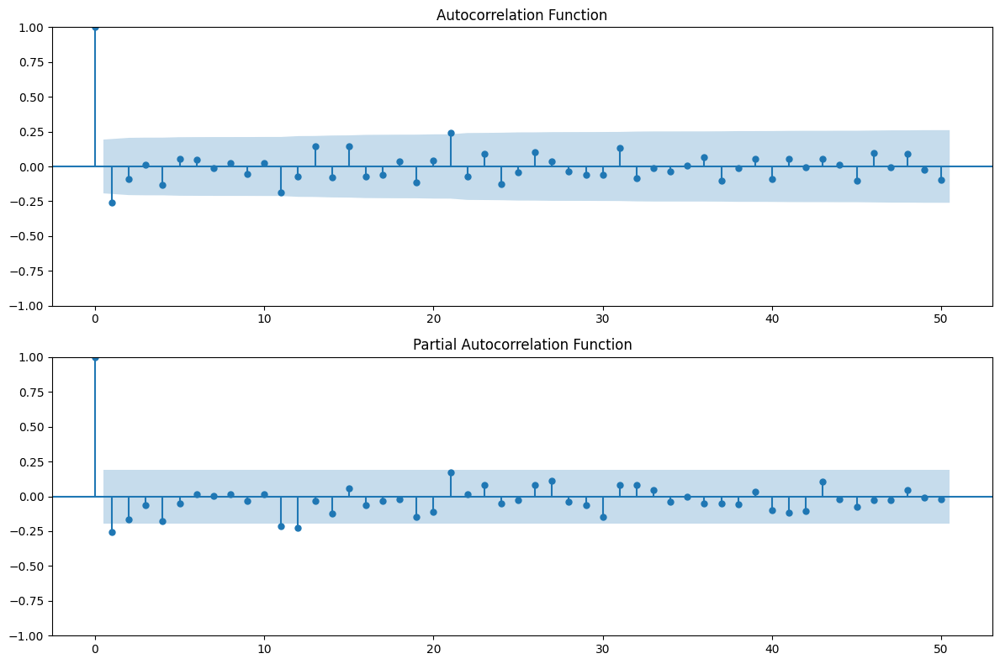

In [58]:
#ACF and PACF
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,8))

sm.graphics.tsa.plot_acf(differenced_data['VIX'], lags=50, ax=ax1)
ax1.set_title('Autocorrelation Function')

sm.graphics.tsa.plot_pacf(differenced_data['VIX'], lags=50, ax=ax2)
ax2.set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()
